# Multimodal Efficient Coding Integration
#### Project by Angie Georgaras, Patrick Nolan, and Harmeet Singh


A Jupyter Notebook demonstration of the efficient coding principle across various sensory modalities. (black and white images, color images, and audio)
 
Explanation of this notebook begins <a href='#start'>here</a>
 
Code for modalities adapted from COMP 386 coursework and tutorials.


In [194]:
#packages used throughout the notebook
import numpy as np
import pylab as py 
%matplotlib inline 
from IPython.display import Image, Audio
import math
import sklearn.decomposition 
from sklearn import decomposition
import PIL
import cv2 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from matplotlib import pylab
from scipy import ndimage
import matplotlib
import wave
import sys
import random as random

# Black and White Vision Code

These functions are for collecting patches from black and white images, and then displaying them in order to show what they look like once PCA and ICA have been run.

In [195]:
def collectPatchesBW(numPatches, patchWidth, filePath):
    maxTries = numPatches * 50
    firstPatch = 0 # the first patch number accepted from an image
    firstTry = 0 # the first attempt to take a patch from the image
    patchCount = 0 # number of collected patches
    tryCount = 0 # number of attempted collected patches
    numPixels = patchWidth * patchWidth
    patchSample = np.zeros([patchWidth,patchWidth],'double')
    patch = np.zeros([numPixels,1],'double')
    imgPatches = np.zeros([numPixels,numPatches],'double')                                          
    # chooses the image that we're sampling from
    imgCount = 1  
    image = PIL.Image.open(filePath + str(imgCount) + '.jpg')
    imageHeight, imageWidth, imageChannels = matplotlib.pyplot.imread(filePath + str(imgCount) + '.jpg').shape
    image = image.convert('L')
    image = np.asarray(image, 'double').transpose()
    # normalizing the image
    image -= image.mean()
    image /= image.std()
    while patchCount < numPatches and tryCount < numPatches:
        tryCount += 1
        if (tryCount - firstTry) > maxTries/2 or (patchCount - firstPatch) > numPatches/2:
        # change the image sampled from to the next in the folder
            imgCount += 1
            image = PIL.Image.open(filePath + str(imgCount) + '.jpg')
            imageHeight, imageWidth, imageChannels = matplotlib.pyplot.imread(filePath + str(imgCount) + '.jpg').shape
            image = image.convert('L')
            image = np.asarray(image, 'double').transpose()
            # normalizing the image
            image -= image.mean()
            image /= image.std()
            firstPatch = patchCount
            firstTry = tryCount
        #starts patch collection in a random space
        px = np.random.randint(0,imageWidth - patchWidth)
        py = np.random.randint(0,imageHeight - patchWidth)
        patchSample = image[px:px+patchWidth,py:py+patchWidth].copy()
        patchStd = patchSample.std()
        if patchStd > 0.0: # > 0 to remove blank/uninteresting patches for speed
            # create the patch vector    
            patch = np.reshape(patchSample, numPixels)     
            patch = patch - np.mean(patch)         
            imgPatches[:,patchCount] = patch.copy()
            patchCount += 1  
    return imgPatches

In [196]:
#this function displays BW image patches
def showPatchesBW(prePatches, showPatchNum = 16, display=True):
    patches = prePatches
    totalPatches = patches.shape[1]
    dataDim = patches.shape[0]
    patchWidth = int(np.round(np.sqrt(dataDim)))
    # extract show_patch_num patches
    displayPatch = np.zeros([dataDim, showPatchNum], float)
    for i in range(0,showPatchNum):
        patch_i = i * totalPatches // showPatchNum
        patch = patches[:,patch_i].copy()
        pmax  = patch.max()
        pmin = patch.min()
        # fix patch range from min to max to 0 to 1
        if pmax > pmin: 
            patch = (patch - pmin) / (pmax - pmin)
        displayPatch[:,i] = patch.copy()
    bw = 5    # border width
    pw = patchWidth
    patchesY = int(np.sqrt(showPatchNum))
    patchesX = int(np.ceil(float(showPatchNum) / patchesY))
    patchImg = displayPatch.max() * np.ones([(pw + bw) * patchesX - bw, patchesY * (pw + bw) - bw], float)
    for i in range(0,showPatchNum):
        y_i = i // patchesY
        x_i = i % patchesY
        reshaped = displayPatch[:,i].reshape((pw,pw))
        fullPatch = np.zeros([pw, pw], float)
        fullPatch[0:pw,:] = reshaped[:,:].copy()
        patchImg[x_i*(pw+bw):x_i*(pw+bw)+pw,y_i*(pw+bw):y_i*(pw+bw)+pw] = fullPatch

    if display:
        py.bone()
        py.imshow(patchImg.T, interpolation='nearest')
        py.axis('off')
    return

# Black and White Vision Code

These functions are for collecting patches from full color images, and then displaying them in order to show what they look like once PCA and ICA have been run.

In [197]:
# this function collects patches from the natural images
def collectPatchesColor(numPatches, patchWidth, filePath):
    maxTries = numPatches * 50
    imageWidth = 200
    firstPatch = 0  # the first patch number accepted from an image
    firstTry = 0  # the first attempt to take a patch from the image
    patchCount = 0  # number of collected patches
    tryCount = 0  # number of attempted collected patches
    numPixels = 3 * patchWidth * patchWidth
    patchSample = np.zeros([3, patchWidth, patchWidth], float)
    patch = np.zeros([numPixels], float)
    imgPatches = np.zeros([numPixels, numPatches], float)
  # this chooses the image we're sampling from, starting from the first image
    imgCount = 1
    image = PIL.Image.open(filePath + str(imgCount) + '.jpg')
    image = np.asarray(image, 'double').transpose()
    image = image[0:3, :, :]
  # normalizing the image
    image -= image.mean()
    image /= image.std()
  # collect the patches from images in file
    while patchCount < numPatches and tryCount < maxTries:
        tryCount += 1  # number of total patches attempted
        if tryCount - firstTry > maxTries / 2 or patchCount \
            - firstPatch > numPatches / 2:
            imgCount += 1  # this switches to the next image we're sampling from!
            image = PIL.Image.open(filePath + str(imgCount) + '.jpg')
            image = np.asarray(image, 'double').transpose()
            image = image[0:3, :, :]
            image -= image.mean()
            image /= image.std()
            firstPatch = patchCount
            firstTry = tryCount
        px = np.random.randint(0, imageWidth - patchWidth)
        py = np.random.randint(0, imageWidth - patchWidth)
        patchSample = image[:, px:px + patchWidth, py:py
                            + patchWidth].copy()
        patch_std = patchSample.std()
        if patch_std > 0.0:  # > 0 to remove blank/uninteresting patches for speed
      # create the patch vector
            patch = np.reshape(patchSample, numPixels)
            patch = patch - np.mean(patch)
            imgPatches[:, patchCount] = patch.copy()
            patchCount += 1
    return imgPatches

In [198]:
#this function displays the collected patches 
def showPatchesColor(prePatches, showPatchNum=16, display=True):
    patches = prePatches
    totalPatches = patches.shape[1]
    dataDim = patches.shape[0]
    patchWidth = int(np.round(np.sqrt(dataDim))) - 6
  # extract showPatchNum patches
    displayPatch = np.zeros([dataDim, showPatchNum], float)
    for i in range(0, showPatchNum):
        patch_i = i * totalPatches // showPatchNum
        patch = patches[:, patch_i].copy()
        pmax = patch.max()
        pmin = patch.min()
    # fix patch range from min to max to 0 to 1
        if pmax > pmin:
            patch = (patch - pmin) / (pmax - pmin)
        displayPatch[:, i] = patch.copy()
    bw = 5  # border width
    pw = patchWidth
    patchesY = int(np.sqrt(showPatchNum))
    patchesX = int(np.ceil(float(showPatchNum) / patchesY))
    patchImg = displayPatch.max() * np.ones([3, (pw + bw) * patchesX
            - bw, patchesY * (pw + bw) - bw], float)
    for i in range(0, showPatchNum):
        y_i = i // patchesY
        x_i = i % patchesY
    # reshape patch sizing
        reshaped = displayPatch[:, i].reshape((3, 8, 8))
        fullPatch = np.zeros([3, pw, pw], float)
        fullPatch[0:3, 0:8, 0:8] = reshaped[:, :, :].copy()
        patchImg[:, x_i * (pw + bw):x_i * (pw + bw) + pw, y_i * (pw
                 + bw):y_i * (pw + bw) + pw] = fullPatch
    if display:
    # displays the patches
        py.imshow(patchImg[:, :, :].T, interpolation='nearest')
        py.axis('off')
    return

# Audio Code

These functions are for collecting patches .wav sound files, and then displaying them in order to show what they look like once PCA and ICA have been run.

In [237]:
def collectPatchesAudio(file):
    spf = wave.open('audio/' + file + '.wav','r')
    # extract raw audio from .wav file
    signal = spf.readframes(-1)
    signal = np.frombuffer(signal, 'Int16')
    fs = spf.getframerate()
    print(fs)
    numSamples = len(signal)  
    width = 100
    ds = 3
    numPatches = 100000
    audioPatches = np.zeros((numPatches,width))
    for i in range(numPatches):
        x_start = np.random.randint(0,numSamples-ds*width-2)
        audioPatches[i,:] = signal[x_start:x_start+ds*width-1:ds]
    return(audioPatches)

In [200]:
def showPatchesAudio(patches):
    width = 100
    cnt = 0
    for cnt in range(20):
        plt.subplot(5, 5, cnt+1)
        frame = pylab.gca()
        frame.axes.get_xaxis().set_ticklabels([])
        frame.axes.get_yaxis().set_ticklabels([])
        plt.plot(range(width),patches[cnt,:])
    plt.show()

<a id='start'></a>

# Multimodal Efficient Coding Integration

### Background and Motivation

From a computational perspective, the lowest level of stimuli processing in the brain across various sensory modalities are performing the same computation with a difference in input. With a computational model, we can show this using the same algorithm regardless of input type. In terms of Marr's Levels of Analysis, this model operates on the computational level. This means that our focus here is on modeling the overall behavior of these systems. This is a demonstration of the efficient coding principle.

This presentation aims to model processing that occurs on black and white images, color images, audio, and video, and showcase the similarity processing.

#  First Level of Processing for Vision in V1

When we look at the visual and auditory system overall, we know that they differ in biology. To quickly summarize, we know that for visual stimuli, we first see a visual signal produced via rods and cones in the retina. From here this impulse travels down the optic nerve (which consists of ganglion nerve axons) to the optic chiasm, where we see information from left and right visual fields in the eyes cross over. Then the signal passes through the lateral geniculate nuclues, which then pushes the signal to the primary visual cortex (V1).


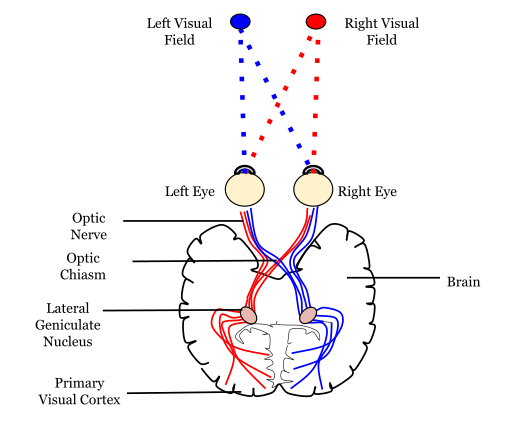

In [201]:
Image(filename="figures/v1.png")

The first place in the cortex the visual signal reaches is in V1, which is located at the back of your head (posterior occipital lobe). V1 plays a key role in edge-detection, as well as processes a small amount of info on color. V1 cells have been extensively studied and have been shown to be sensitive to planar sinusoids of specific locations, orientations, spatial frequencies, and phases. ## better way to phrase this??



This response resembles a 2D gabor filter, which is a planar sine wave in a gaussian envelope. Below are two measured gabor filters produced from V1 simple cells that respond to different patterns of visual input.

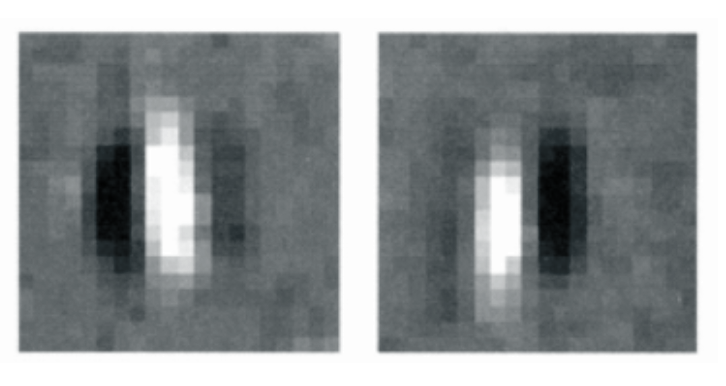

In [202]:
Image(filename='figures/gabor.png')

# How do we model these filters?

Say that starting with black and white images, we sample random patches. Below is a function that does this by taking a folder of natural images and looping through the images collecting patches to filter. Below are two of the images.

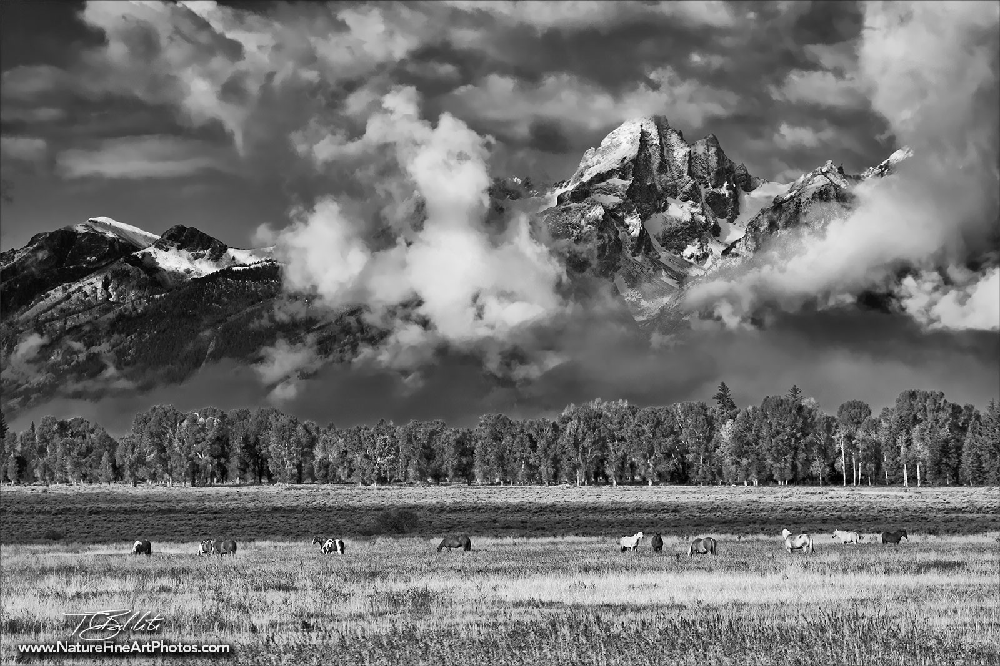

In [203]:
Image(filename='BW/natural/5.jpg')

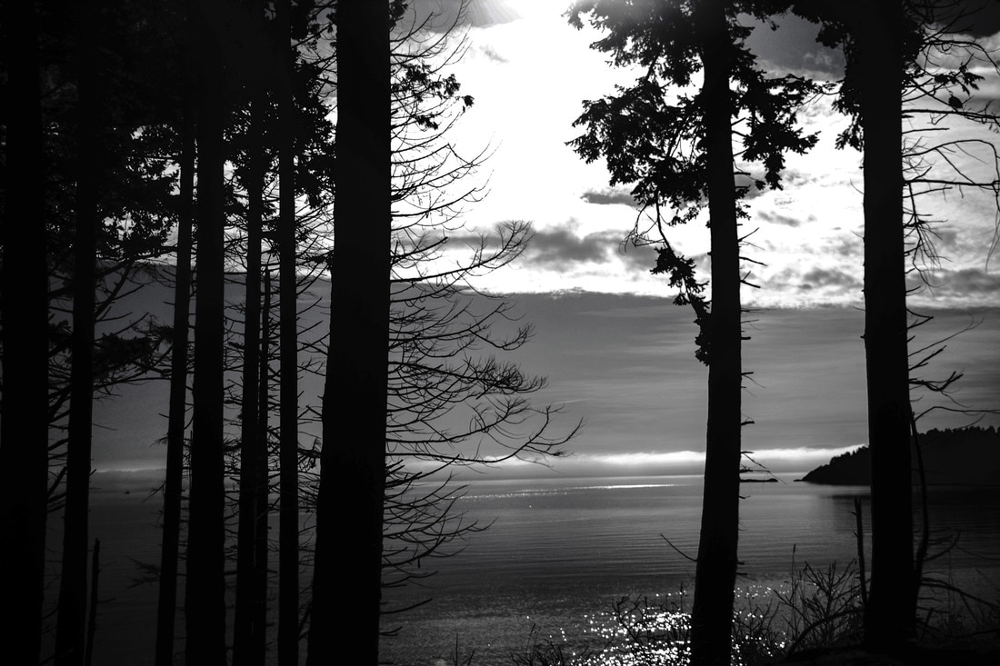

In [204]:
Image(filename='BW/natural/7.jpg')

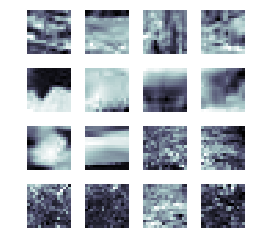

In [205]:
patchesBWNatural = collectPatchesBW(50000, 16, 'BW/natural/')
showPatchesBW(patchesBWNatural)

# What do we mean by Neural Efficiency/Efficient Coding?

Lets take a break here to discuss what exactly we're aiming to do with these image patches, and how to do so "efficiently.

Efficiency can be represented in several different ways. In the brain, we could minimize the computer of neurons used for representing sensory input via compression, a type of compact coding. This strategy is ideal for a computer, but not for the brain as it would be equivalent to minimizing the number of neurons present. We have billions of neurons, and 100 neurons in V1 for every optic nerve axon, so compression simply does not work with this.

So then how can we explain neural efficiency? Something to keep in mind with neural representations of stimuli is metabolic energy. An aim of efficiency is to be energy efficient in biological systems. Thus, when representing neurons, it would be ideal to instead minimize redundancy among existing neurons. This can be explained by independent coding, which ensures that each neuron will be as indepdent as possible from one another.

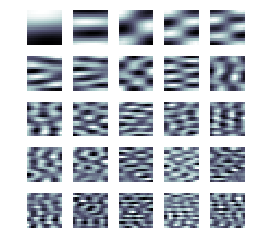

In [206]:
pcatemp = sklearn.decomposition.PCA(n_components=75)
pcafit = pcatemp.fit(np.transpose(patchesBWNatural))

pca_comp = pcafit.components_
showPatchesBW(np.transpose(pca_comp), 25)

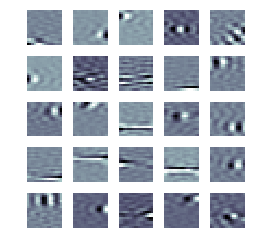

In [207]:
icatemp = sklearn.decomposition.FastICA(n_components=75)
icafit = icatemp.fit(np.transpose(patchesBWNatural))

ica_comp = icafit.components_
showPatchesBW(np.transpose(ica_comp), 25)

Here we are using a machine learning algorithm, principal components analysis (PCA) as contrast to independent components analysis, ICA. ICA represents what we're looking for in a terms of neural efficiency. ICA works to find components that are as statistically independent as possible, meaning that they are not normally distributed. By looking at independent components, ICA mirrors what the brain does in low level stimuli processing for vision and hearing, as we said earlier that key to neural processing is minimizing redundancy to be metabolically efficient. We are contrasting this to PCA, as PCA assumed that the components are normal instead. PCA aims to explain the variance present in data rather than statistical independence. This is not ideal for natural sensory stimuli given that "normal" images and sounds share several key statistical properties. This relates to how visual and auditory systems have evolved over time in response to what they have been exposed to. 

How can we tell from looking at these resulting patches presented above that this filter response is neural? From looking at some of the patches above, we can see small dots that resemble the measured 2D gabor filter responses that have been measured in V1 simple cells, showing that this is an accurate model. What exactly are these filters displaying? Once again, we can say that these are detectors for edges in the sample image patches.

An important thing to note is that there is a key difference seen if we use "non-natural" images, even when running ICA. The reason for this once again lies in the statistical differences noted between natural and non-natural stimuli. Below, the resulting ICA filter is not gabor-like due to the input images not being appropriate for the algorithm. The original images are "white noise" images, such as the image below.

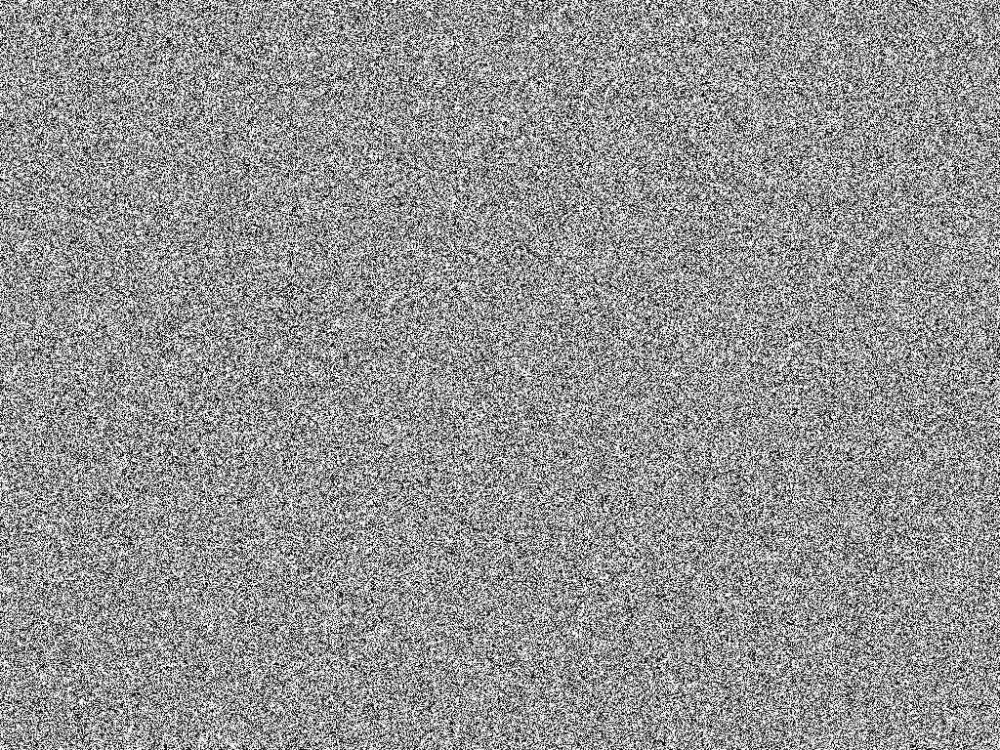

In [208]:
Image(filename='BW/unnatural/1.jpg')

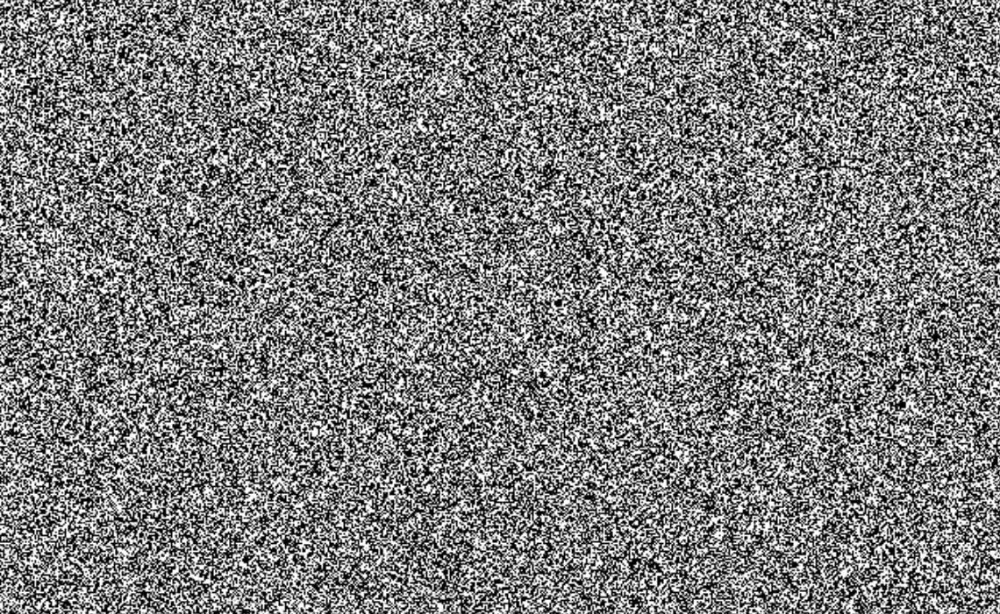

In [209]:
Image(filename='BW/unnatural/3.jpg')

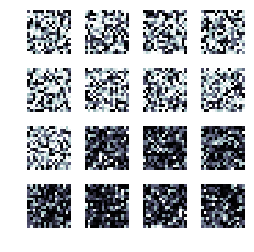

In [210]:
patchesBWUnnatural = collectPatchesBW(50000, 16, 'BW/unnatural/')
showPatchesBW(patchesBWUnnatural)

Here are the resulting patches from these images, as well as what we get when we run PCA and ICA.

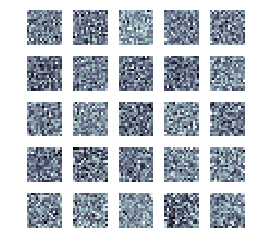

In [211]:
pcatemp = sklearn.decomposition.PCA(n_components=75)
pcafit = pcatemp.fit(np.transpose(patchesBWUnnatural))

pca_comp = pcafit.components_
showPatchesBW(np.transpose(pca_comp), 25)

/Users/angiegeorgaras/anaconda3/lib/python3.6/site-packages/sklearn/decomposition/fastica_.py:118: UserWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


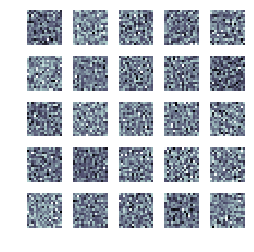

In [212]:
icatemp = sklearn.decomposition.FastICA(n_components=75)
icafit = icatemp.fit(np.transpose(patchesBWUnnatural))

ica_comp = icafit.components_
showPatchesBW(np.transpose(ica_comp), 25)

Lets more on to processing color images using PCA and ICA. The method below works very similarly to the one above, the only difference is that now alonside focusing on planar sinusoids for specific locations, orientations, spatial frequencies, and phases, we are now adding color into the mix. Here are sample patches from a folder of natural color images. Note that these patches have a lot of green. Below these patches are two examples of natural images used. 

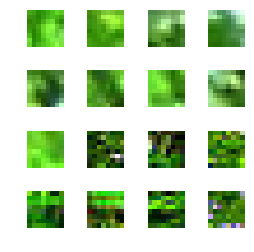

In [213]:
patchesColorNatural = collectPatchesColor(10000, 8, 'color/natural/')
showPatchesColor(patchesColorNatural)

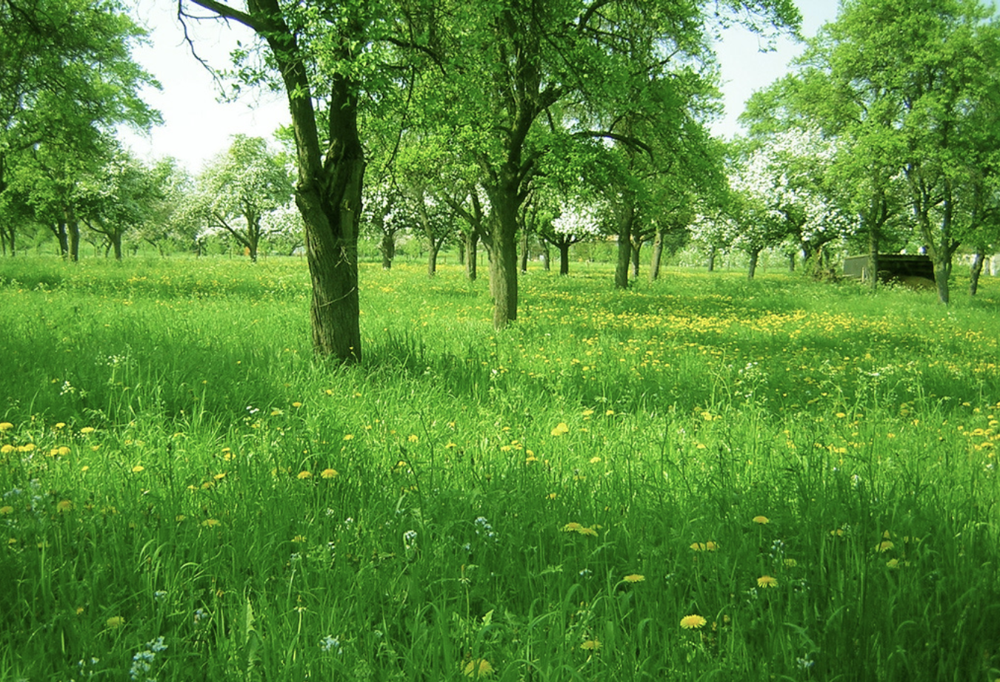

In [214]:
Image(filename='color/natural/1.jpg')

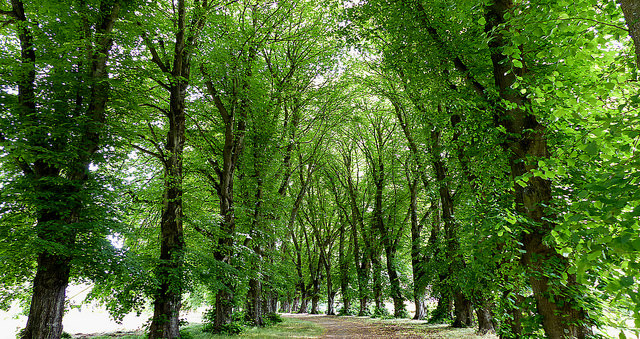

In [215]:
Image(filename='color/natural/2.jpg')

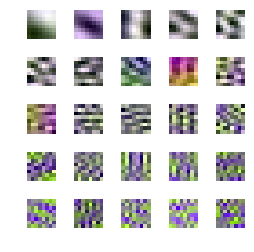

In [216]:
# finding PCA components 
pcatemp = sklearn.decomposition.PCA(n_components=75)
pcafit = pcatemp.fit(np.transpose(patchesColorNatural))

pca_comp = pcafit.components_
showPatchesColor(np.transpose(pca_comp), 25)

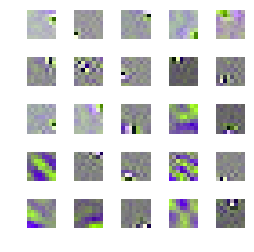

In [217]:
#finding ICA components
icatemp_c = sklearn.decomposition.FastICA(n_components=75)
icafit_c = icatemp_c.fit(np.transpose(patchesColorNatural))

ica_comp_c = icafit_c.components_
showPatchesColor(np.transpose(ica_comp_c), 25)

Some of you may be wondering: if this is ICA run on color images then why are we only seeing some patches with color? The reasoning for this is that the brain prioritizes luminance when processing color images in V1. As stated beforehand, V1 processes a small amount of color, but its focus is on things like edges and orientation. 

Similar to black and white images, color images do not work well with unnatural images, such as "psychedelic" ones as shown below. 

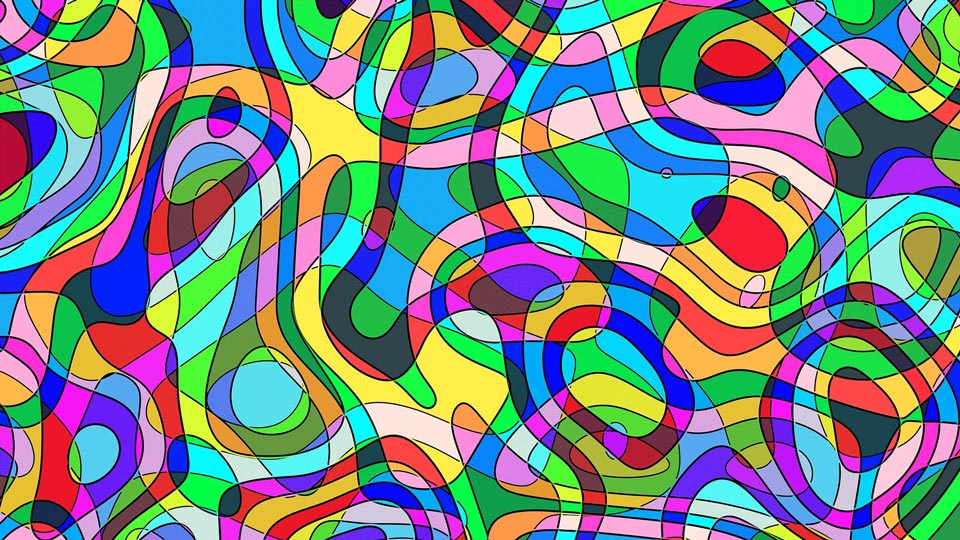

In [218]:
Image(filename='color/unnatural/1.jpg')

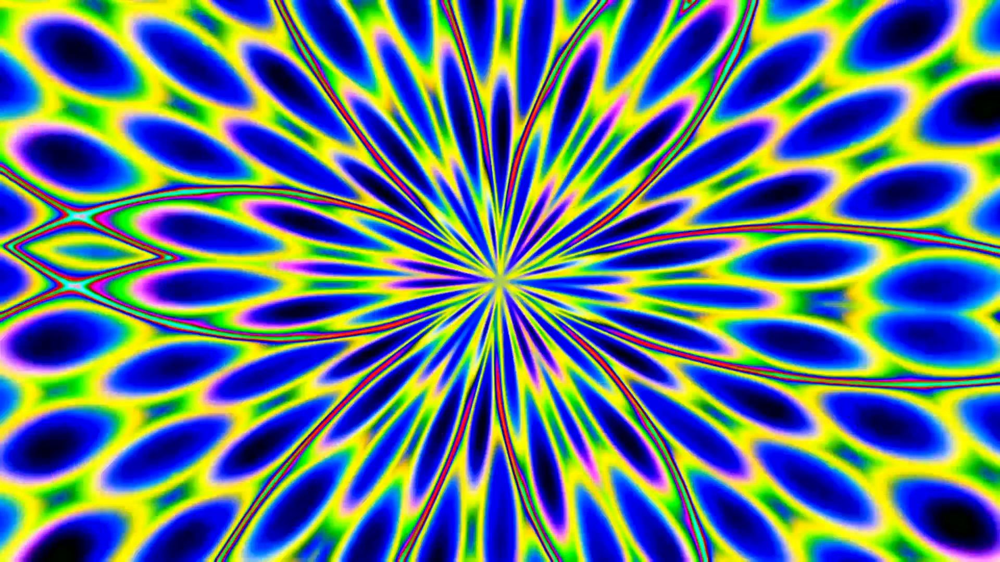

In [219]:
Image(filename='color/unnatural/2.jpg')

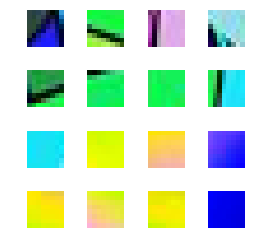

In [220]:
patchesColorUnnatural = collectPatchesColor(10000, 8, 'color/unnatural/')
showPatchesColor(patchesColorUnnatural)

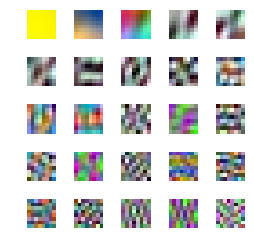

In [221]:
pcatemp = sklearn.decomposition.PCA(n_components=75)
pcafit = pcatemp.fit(np.transpose(patchesColorUnnatural))

pca_comp = pcafit.components_
showPatchesColor(np.transpose(pca_comp), 25)

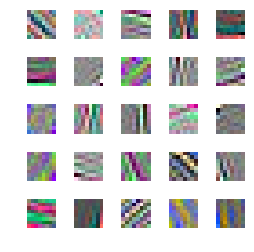

In [222]:
icatemp_c = sklearn.decomposition.FastICA(n_components=75)
icafit_c = icatemp_c.fit(np.transpose(patchesColorUnnatural))

ica_comp_c = icafit_c.components_
showPatchesColor(np.transpose(ica_comp_c), 25)

#  First Level of Processing for Audio in the Auditory Nerve


Now to look at another sensory modality, sound. Auditory information enters the ear canal as sound waves, and this sound is converted to neural impulses via hair cells in the cochlea. From here we'll focus on where sound is first processed, which is precortically in the auditory nerve that is composed of spiral ganglion axons. Here, observed receptive field responses are similar in shape to a gammatone filter (displayed below), which is a linear filter produced by a gamma distribution and a sinusoidal tone. This receptive field has this shape as a result of efficient coding in the auditory nerve, similar to 2D gabor filters being a result of efficient coding in V1.



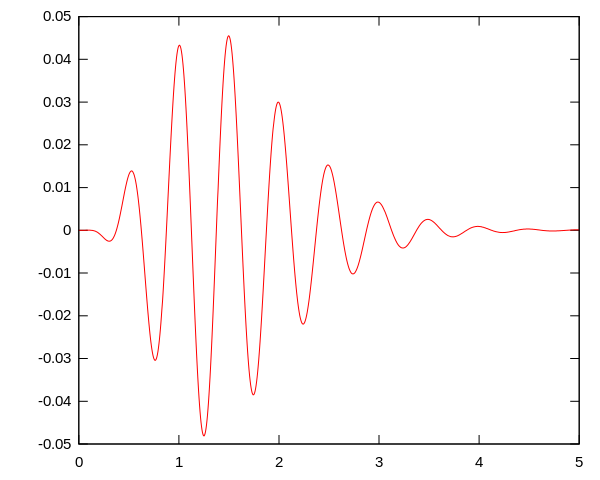

In [236]:
Image(filename="figures/gamma.png")

In [ ]:
Image(filename="figures/bw.png")

/Users/angiegeorgaras/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  """


44100


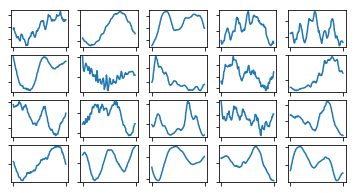

In [238]:
naturalSound = collectPatchesAudio('bill')
showPatchesAudio(naturalSound)

Here collected sound patches from our natural speech example, which is a commencement speech given by Bill Nye (The Science Guy) at UMass Lowell in 2014.
[Natural speech audio clip](https://www.youtube.com/watch?v=wzwX-qu5fRA)

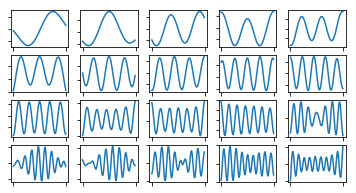

In [224]:
# finding PCA components 
pcatemp = sklearn.decomposition.PCA(n_components=25)
pcafit = pcatemp.fit(naturalSound)

pca_comp = pcafit.components_
showPatchesAudio(pca_comp)

Here, we can see that running PCA on these patches to extract filters does not mimick observed neural responses. Yet when we run ICA, we do see some of the resulting filters mirror this response.

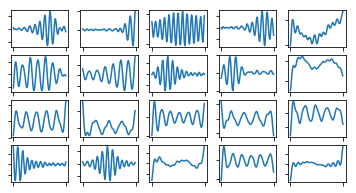

In [253]:
# finding ICA components 
icatemp = sklearn.decomposition.FastICA(n_components=25)
icafit = icatemp.fit(naturalSound)

ica_comp = icafit.components_
showPatchesAudio(ica_comp)

/Users/angiegeorgaras/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  """


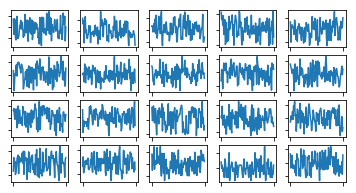

In [226]:
unnaturalSound = collectPatchesAudio('whitenoise')
showPatchesAudio(unnaturalSound)

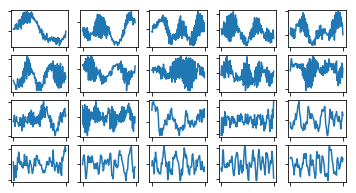

In [227]:
# finding PCA components 
pcatemp = sklearn.decomposition.PCA(n_components=25)
pcafit = pcatemp.fit(unnaturalSound)

pca_comp = pcafit.components_
showPatchesAudio(pca_comp)

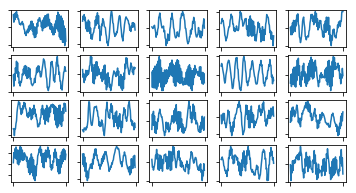

In [228]:
# finding ICA components 
icatemp = sklearn.decomposition.FastICA(n_components=25)
icafit = icatemp.fit(unnaturalSound)

ica_comp = icafit.components_
showPatchesAudio(ica_comp)

# Conclusions

Here are the previously shown patches side by side, ordered by modality and then displayed again together for neural responses. 

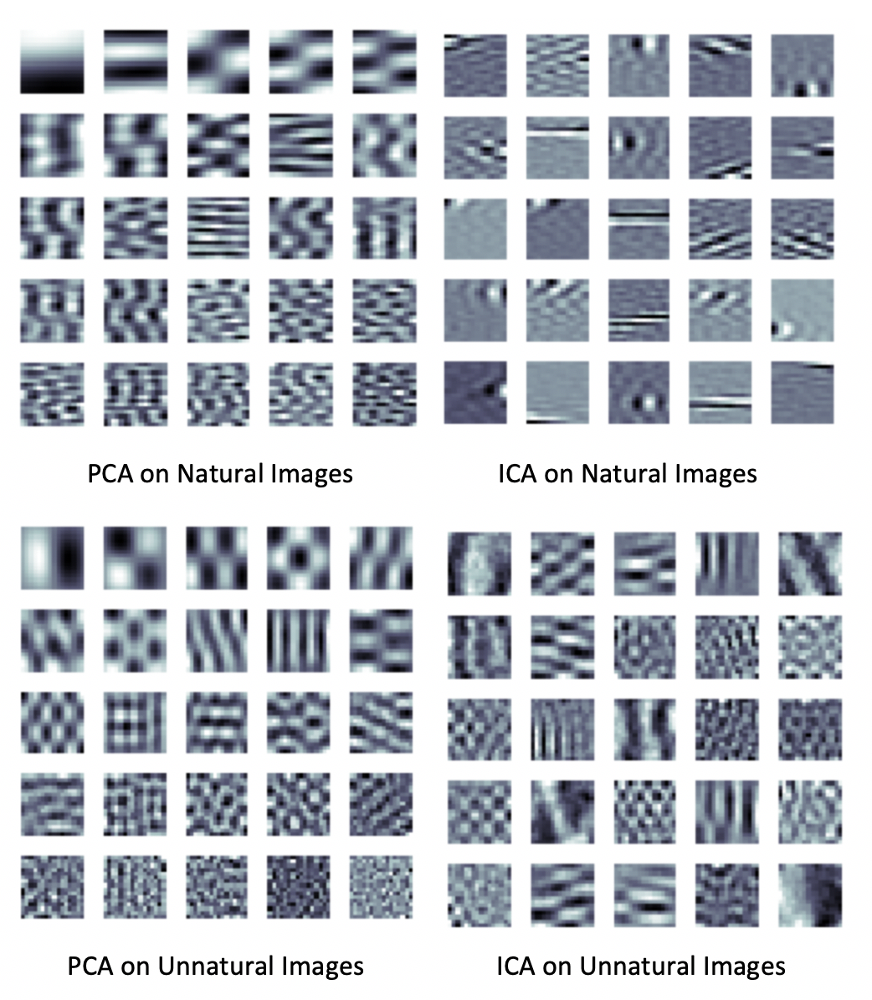

In [229]:
Image(filename="figures/bw.png")

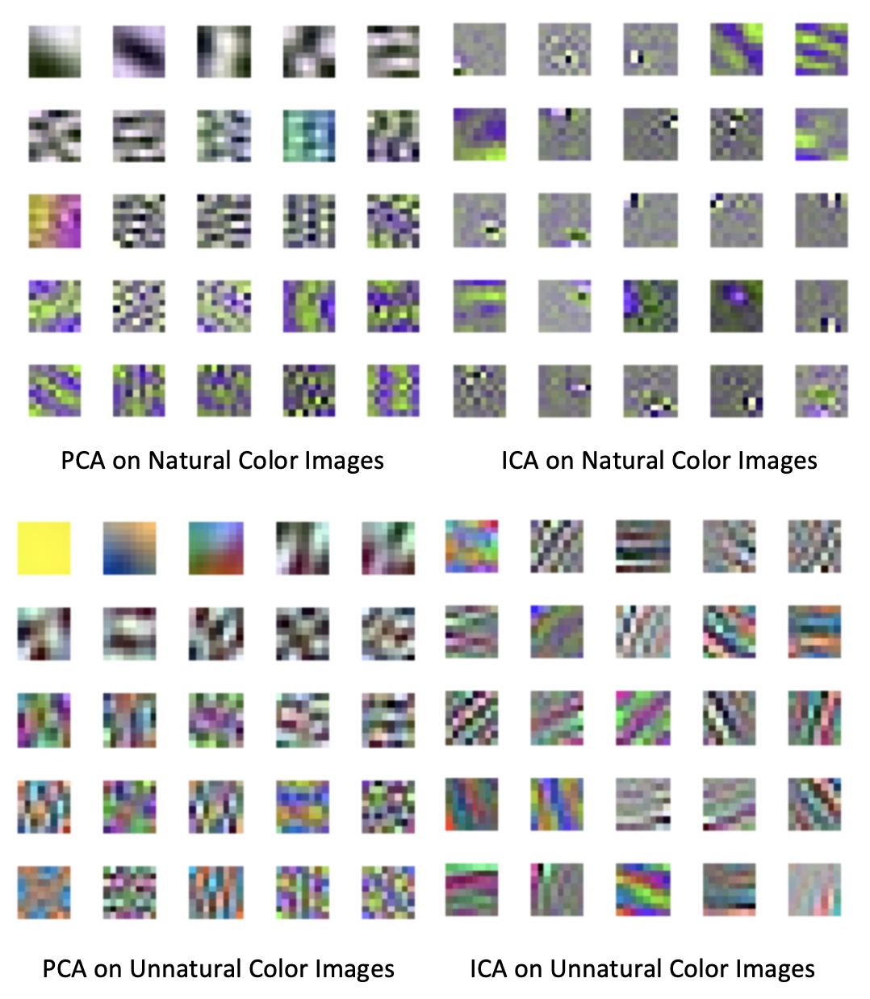

In [230]:
Image(filename="figures/color.png")

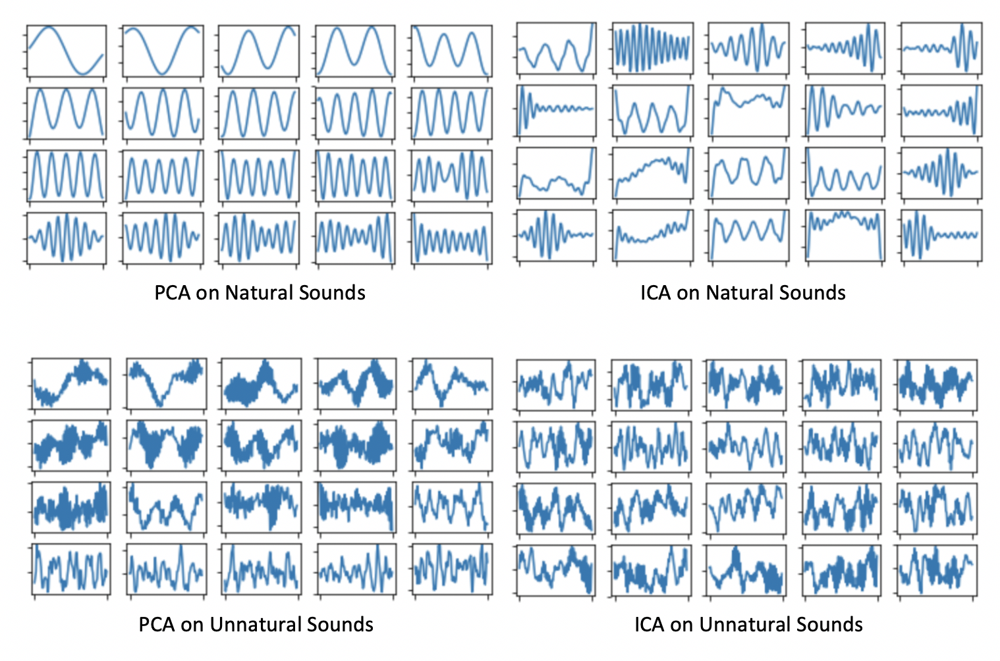

In [231]:
Image(filename="figures/audio.png")